# Загрузка изображения в Python

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/MVRonkin/for_course_DLCV/blob/main/workshops/WS1_PILLOW.ipynb)

## Pillow Library



    
Библиотека Python Pillow построена на основе PIL (Python Image Library). Библиотека Pillow поддерживает множество форматов файлов изображений, включая BMP, PNG, JPEG и TIFF. <br> Самый важный класс в библиотеке изображений Python - это класс Image, определенный в одноименном модуле. <br> Модуль Pillow Image предоставляет функции open () и show () для чтения и отображения изображения соответственно. Для отображения изображения Pillow сначала преобразует изображение в формат .png (в ОС Windows) и сохраняет его во временном буфере, а затем отображает его. Следовательно, из-за преобразования формата изображения в ".png" некоторые свойства исходного формата файла изображения могут быть потеряны (например, анимация). Поэтому рекомендуется использовать этот метод только в тестовых целях.<br> Кроме того, мы будем использовать библиотеку urllib для открытия изображений из Интернета.

<blockquote>
<i>Примечание.</i> Если вы хотите прочитать «gif» или любой другой многокадровый формат, используйте, например, функцию «seek» как показано ниже.

```python
with Image.open("animation.gif") as im:
    im.seek(1) # skip to the second frame

    try:
        while 1:
            im.seek(im.tell()+1)
            # do something to im
    except EOFError:
        pass # end of sequence
```
<!-- https://www.geeksforgeeks.org/python-pillow-tutorial/ 
https://pillow.readthedocs.io/en/stable/handbook/tutorial.html -->

In [ ]:
import PIL

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
plt.rcParams.update({'font.size': 17})


In [ ]:
import urllib.request
from PIL import Image

Скачаем изображение

In [ ]:
image_url = 'https://github.com/MVRonkin/for_course_DLCV/blob/main/image.png?raw=true'
  
urllib.request.urlretrieve(image_url,"image.png")

('image.png', <http.client.HTTPMessage at 0x26eab1f79b0>)

Теперь попробуем его загрузить

In [ ]:
 
img = Image.open("image.png")

img.show(); 


    
    
    
Для изображения из Pillow можно получить несколько характеристик.
Атрибут `format` определяет источник изображения.
Если изображение не было прочитано из файла, устанавливается значение «None».
Атрибут `size` - это кортеж из двух элементов, содержащий ширину и высоту (в пикселях).
Атрибут `mode` определяет тип изображений.
Общие режимы: <ul>
     <li> `L` (яркость) для изображений в оттенках серого,
     <li> `RGB` для полноцветных изображений,
     <li> `CMYK` для дополненных изображений. </ul>

In [ ]:
print('width, height',img.size, 'FORMAT', img.format, 'MODE', img.mode)
 

width, height (1280, 823) FORMAT JPEG MODE RGB




   *Небольшая хитрость для jupyter*: если вы не хотите открывать изображение в новом окне, вы можете использовать имя изображения без методов, как показано ниже

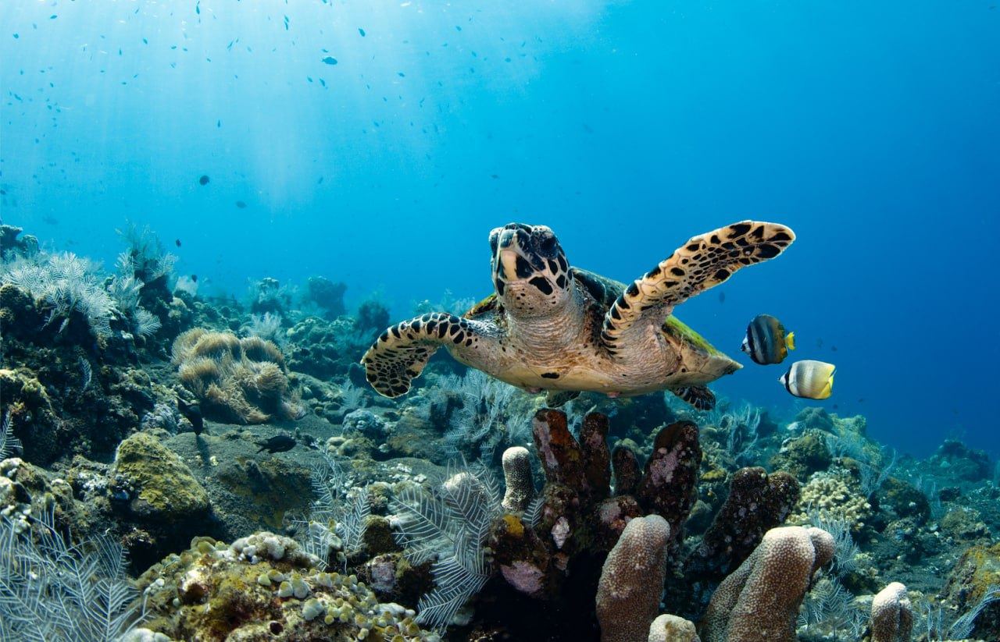

In [ ]:
img

Также изображения могут быть отрисованы с использованием библиотеки `matplotlib`

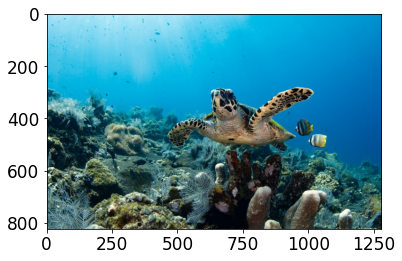

In [ ]:
plt.imshow(img)



Также изображение может быть пересохранено, как без изменений, так и с преобразованием формата, размера и других параметров

In [ ]:
img.save("out.jpg", format = "JPEG", quality=80, optimize=True, progressive=True)

Также библиотека позволяет создавать новые изображения.

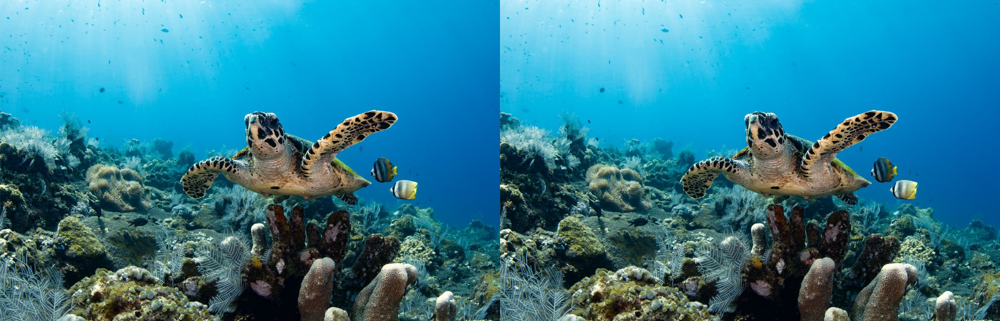

In [ ]:
new_im = Image.new(mode='RGB', size = (2*img.size[0],1*img.size[1]), color=(250,250,250))
new_im.paste(img, (0,0))
new_im.paste(img, (img.size[0],0))
new_im  

И проводить некоторые простые преобразования изображений

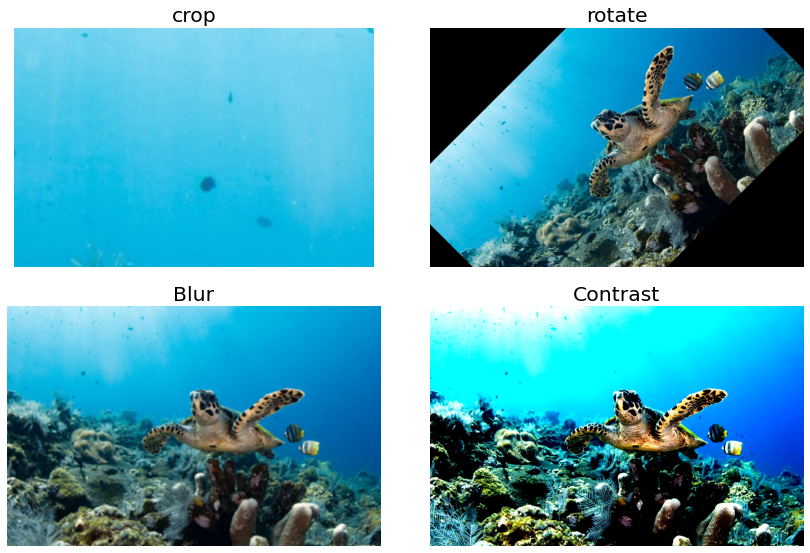

In [ ]:
from PIL import ImageFilter, ImageEnhance

fig, axes = plt.subplots(2,2,figsize=(12,8))

region = img.crop(box= (100, 100, 400, 300) )
axes[0,0].imshow(region); axes[0,0].set_title('crop')

img_45 = img.rotate(angle=45)
axes[0,1].imshow(img_45); axes[0,1].set_title('rotate')

out = img.filter(ImageFilter.BLUR)
axes[1,0].imshow(out); axes[1,0].set_title('Blur')

out = ImageEnhance.Contrast(img).enhance(2.3)
axes[1,1].imshow(out); axes[1,1].set_title('Contrast')

[ax.set_axis_off() for ax in axes.ravel()]
plt.tight_layout()
plt.show()

**Представление изображений**


На самом деле мы можем преобразовать изображение в массив при помощи numpy. В этом случае изображение будет предстовлять собой тензор 

In [ ]:
image = np.array(img)
print(image.shape)

(823, 1280, 3)


Давайте посмотрим что представляют собой каналы тензора с точки зрения изображения

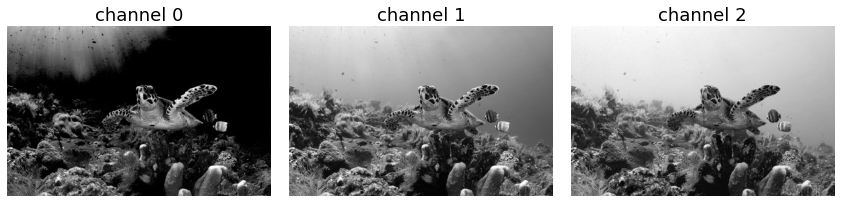

In [ ]:
fig, axes = plt.subplots(1,image.shape[2],figsize=(12,6))

for channel in range(image.shape[2]):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title('channel '+str(channel), fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.show()

А вот что они значат с точки зрения своих численных описаний

In [ ]:
for channel in range(image.shape[2]):
    print('\n\nChannel %d'%channel)
    print(image[:,:,channel])
    



Channel 0
[[171 171 170 ...   3   2   2]
 [173 173 173 ...   2   2   1]
 [177 175 175 ...   1   1   0]
 ...
 [133  93  70 ...  51  53  57]
 [128  93  66 ...  46  26  25]
 [131 100  68 ...  17   2   9]]


Channel 1
[[227 227 228 ... 145 146 146]
 [229 229 229 ... 146 146 146]
 [230 231 231 ... 147 147 147]
 ...
 [162 125 107 ...  59  58  60]
 [158 125 103 ...  53  30  27]
 [161 132 105 ...  26   8  14]]


Channel 2
[[242 242 242 ... 207 209 209]
 [244 244 244 ... 207 209 209]
 [246 246 246 ... 207 207 207]
 ...
 [157 122 113 ...  61  52  51]
 [150 120 109 ...  59  29  22]
 [151 127 111 ...  33   8  10]]


На самом деле интерпретация каждого канала (и всего тензера в целом) зависит от заложенного физического смысла. Так, например мы можем преобразовать `RGB` изображение в формат `HSV` (`Hue, stauration, value`) или любой другой формат (не обязательно 3-х канальный). При этом физический смысл каждого канала будет другим. Подробней о существующих форматах в `PIL` можно узнать [тут](https://pillow.readthedocs.io/en/stable/handbook/concepts.html#concept-modes).

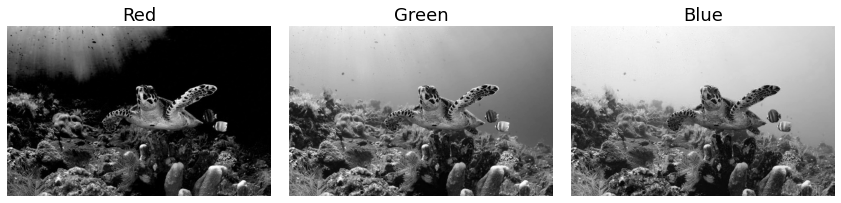

In [ ]:
fig, axes = plt.subplots(1,image.shape[2],figsize=(12,6))

channel_names = ['Red','Green','Blue']

for channel,channel_name  in enumerate(channel_names):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.show()

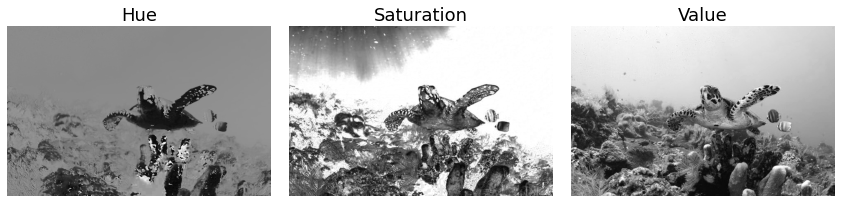

In [ ]:
image = np.array(Image.open("image.png").convert('HSV'))

fig, axes = plt.subplots(1,image.shape[2],figsize=(12,6))

channel_names = ['Hue','Saturation','Value']

for channel,channel_name  in enumerate(channel_names):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.show()




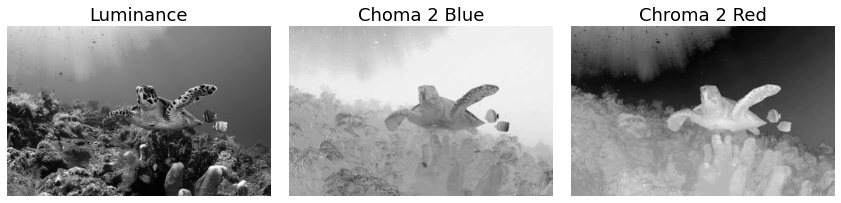

In [ ]:
image = np.array(Image.open("image.png").convert('YCbCr'))

fig, axes = plt.subplots(1,image.shape[2],figsize=(12,6))

channel_names = ['Luminance','Choma 2 Blue','Chroma 2 Red']

for channel,channel_name  in enumerate(channel_names):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.show()

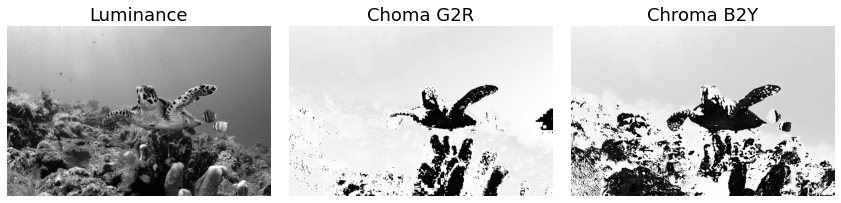

In [ ]:
from PIL import ImageCms
# Convert to Lab colourspace
rgb2lab = ImageCms.buildTransformFromOpenProfiles(ImageCms.createProfile("sRGB"), 
                                                  ImageCms.createProfile("LAB"), "RGB", "LAB")

image = Image.open('image.png').convert('RGB')
image = np.array(ImageCms.applyTransform(image, rgb2lab))

fig, axes = plt.subplots(1,image.shape[2],figsize=(12,6))

channel_names = ['Luminance','Choma G2R','Chroma B2Y']

for channel,channel_name  in enumerate(channel_names):
    axes[channel].imshow(image[:,:,channel], cmap='gray')
    axes[channel].set_title(channel_name, fontsize=18)
    axes[channel].set_axis_off()

plt.tight_layout()
plt.show()

Точно также мы можем получить монохромное изображение. Мы можем воспользоваться стандартной операцией конвертации, предусмотренной, например, в пакете PILLOW, однако, в данном случае мы можем провести эту операцию вручную. Для этого воспользуемся рекомендованным преобразованием пакета PILLOW:
$$  L = R * 299/1000 + G * 587/1000 + B * 114/1000 $$

Отметим, что также можно открыть изображение в оттенках сероого командой
```python
    img = Image.open('image.png').convert('L')
```

In [ ]:
def rgb_2_gray(image):
    image = np.array(image)
    R,G,B = image[:,:,0],image[:,:,1],image[:,:,2]
    return (R*0.299+G*0.587+B*0.114).astype(int)



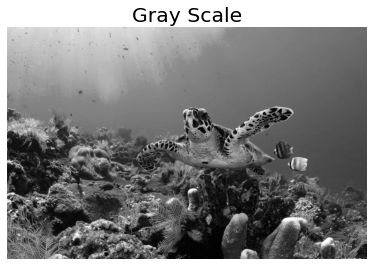

In [ ]:
image = np.array(Image.open("image.png"))
plt.imshow(rgb_2_gray(image),cmap='gray')
plt.title('Gray Scale');plt.axis('off');plt.tight_layout();plt.show()

Точно также можно получить бинарное изображение

In [ ]:
def rgb_2_bunary(image,threshold=100):
    gray = rgb_2_gray(image)
    return gray>threshold

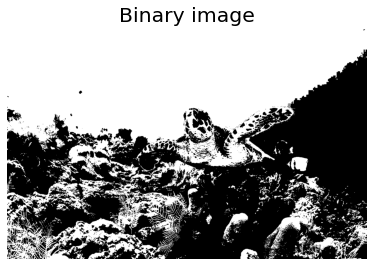

In [ ]:
image = Image.open("image.png")
plt.imshow(rgb_2_bunary(image),cmap='gray')
plt.title('Binary image');plt.axis('off');plt.tight_layout();plt.show()

Чтобы лучше понять значения каждого канала мы также можем провести некоторые простые преобразования с каналами:

(823, 1280, 3)


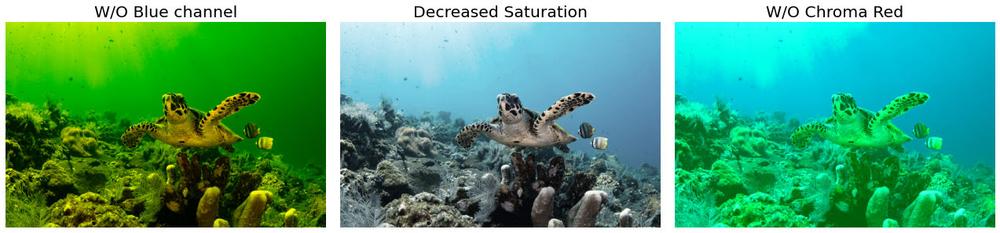

In [ ]:
fig, axes = plt.subplots(1,3,figsize=(18,6))

image = np.array(Image.open("image.png"))
print(image.shape)

image[:,:,2] = 0
axes[0].imshow(image);axes[0].set_title('W/O Blue channel');axes[0].axis('off');

image = np.array(Image.open("image.png").convert('HSV'))
image[:,:,1] //= 2
image = Image.fromarray(image, mode='HSV').convert('RGB')
axes[1].imshow(image);axes[1].set_title('Decreased Saturation');axes[1].axis('off');


image = np.array(Image.open("image.png").convert('YCbCr'))
image[:,:,2] =0
image = Image.fromarray(image, mode='YCbCr').convert('RGB')
axes[2].imshow(image);axes[2].set_title('W/O Chroma Red');axes[2].axis('off');
plt.tight_layout();plt.show()

Теперь посмотрим к чем приведет перемешивание каналов


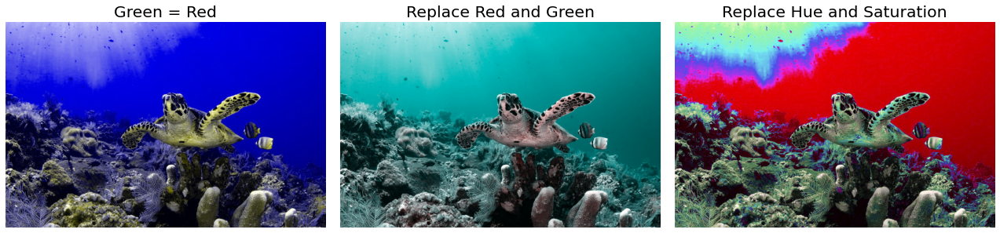

In [ ]:
fig, axes = plt.subplots(1,3,figsize=(18,6))

image = np.array(Image.open("image.png"))
image[:,:,1] = image[:,:,0]
axes[0].imshow(image);axes[0].set_title('Green = Red');axes[0].axis('off');

image = np.array(Image.open("image.png"))
image[:,:,2],image[:,:,1] = image[:,:,1],image[:,:,2]
axes[1].imshow(image);axes[1].set_title('Replace Red and Green');axes[1].axis('off');


image = np.array(Image.open("image.png").convert('HSV'))
image[:,:,0],image[:,:,1] = image[:,:,1],image[:,:,0]
image = Image.fromarray(image, mode='HSV').convert('RGB')

axes[2].imshow(image);axes[2].set_title('Replace Hue and Saturation');axes[2].axis('off');

plt.tight_layout();plt.show()

Также, чтобы лучше понять сущность цифрового изображения давайте посмотрим что такое пространственное разрешение (число пикселей). Для этого попробуем понизить разрешение изображения путем передискретизации (то есть прореживания отсчетов с заданным шагом). Отметим, что в целом такая операция должна сопровождаться дополнительно фильтрацией изображений, однако для простоты и наглядности мы опустим этот шаг.

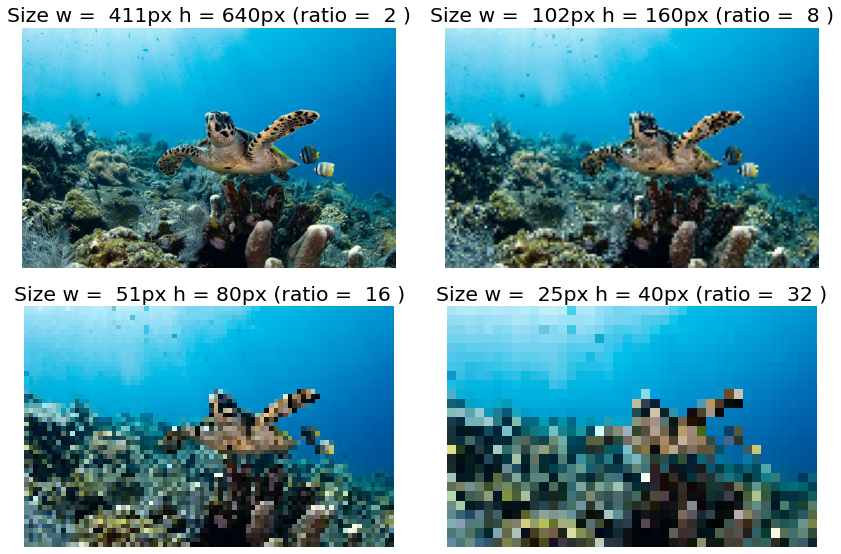

In [ ]:
image = np.array(Image.open("image.png") )

image_shape = image.shape

size_ratios = [2, 8, 16, 32]

fig, axes = plt.subplots(2,len(size_ratios)//2,figsize=(12,8))

for ax, size_ratio  in zip(axes.ravel(), size_ratios):

    ax.imshow(image[::size_ratio,::size_ratio,:] )
    
    ax.set_title(f'Size w =  {image_shape[0]//size_ratio}px h = {image_shape[1]//size_ratio}px (ratio =  {size_ratio} )'  )
    
    ax.set_axis_off()

plt.tight_layout()
plt.show()

Теперь посмотрим, к чему приводит понижение разрешения каждого пикселя. Напомним, что как правило используется 256 значений оттенков (8 бит), однако, мы посмотрим к чему приводит использование пониженного разрешения

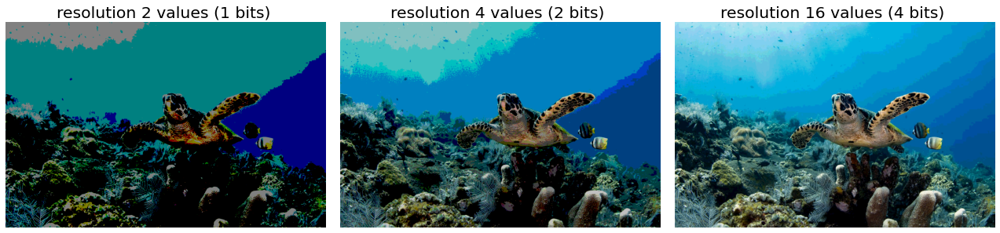

In [ ]:
image = np.array(Image.open("image.png") )

image_shape = image.shape
resolutions = [2,4,16]

fig, axes = plt.subplots(1,len(resolutions),figsize=(18,6))

for ax,res  in zip(axes,resolutions):
    
    quant = 256//res
    im = (quant*(image//quant))

    ax.imshow(im )
    ax.set_title(f'resolution {res} values ({int(np.ceil(np.log2(res)))} bits) ' )
    ax.set_axis_off()

plt.tight_layout()
plt.show()


Отметим, что в 1 битном изображении (2 оттенка) можно заметить более двух цветов, это связано с тем, что для 3 каналов 2 оттенка воплащаются в 8 цветов. Посмотрим, что значат два оттенка для разных цветовых схем

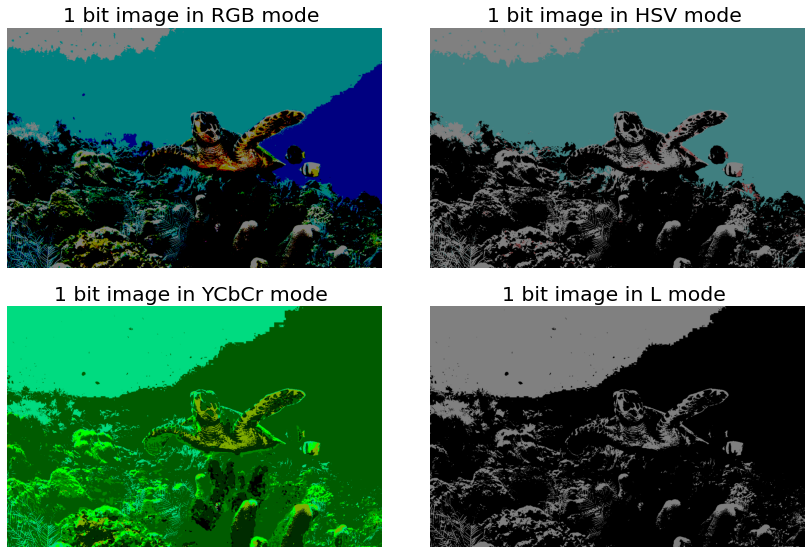

In [ ]:
image = Image.open("image.png") 

image_shape = image.size
modes = ['RGB','HSV','YCbCr','L']
resolution = 2  
res_bits = int(np.ceil(np.log2(resolution)))
fig, axes = plt.subplots(2,len(modes)//2,figsize=(12,8))

for ax,mode  in zip(axes.ravel(),modes):
    
    quant = 256//resolution
    im = np.array(image.copy().convert(mode))
    im = (quant*(im//quant))
    im = Image.fromarray(im,mode=mode).convert('RGB')
    ax.imshow(im )
    ax.set_title(f'{res_bits} bit image in {mode} mode ' )
    ax.set_axis_off()

plt.tight_layout()
plt.show()


Также отметим, что разрешение изображений правилней понижать с использованием интерполяции, например в пакете PILLOW по умолчанию предлагается бикубическая интерполяция, однако мы посмотрим как работает более популярная в глубоком обучении нейронных сетей билинейная интерполяция

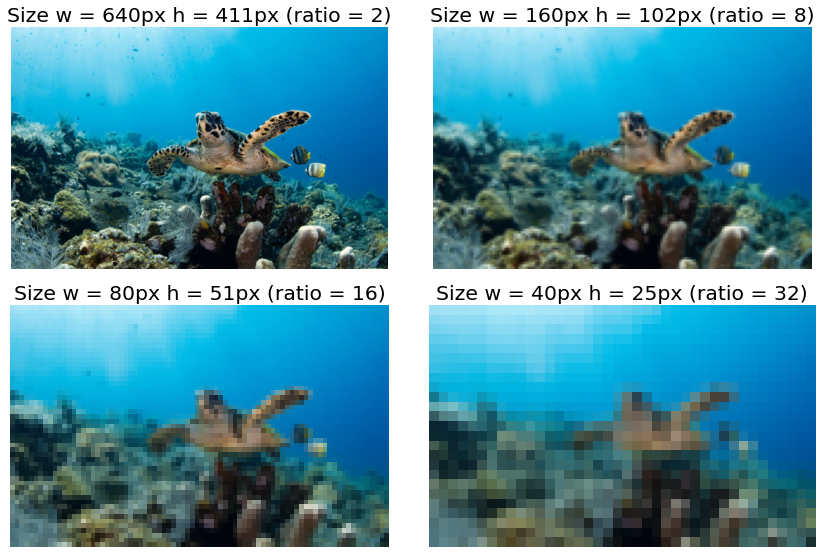

In [ ]:
image = Image.open("image.png") 

image_shape = image.size

size_ratios = [2, 8, 16, 32]

fig, axes = plt.subplots(2,len(size_ratios)//2,figsize=(12,8))

for ax, size_ratio  in zip(axes.ravel(), size_ratios):
    
    ax.imshow(image.resize((image_shape[0]//size_ratio,
                            image_shape[1]//size_ratio),
                            resample = Image.BILINEAR) )
    
    ax.set_title('Size w = '+ 
                  str(image_shape[0]//size_ratio)+ 
                 'px h = '+str(image_shape[1]//size_ratio) +
                 'px (ratio = '+
                  str(size_ratio) +')' )
    
    ax.set_axis_off()

plt.tight_layout()
plt.show()

В конце давайте посмотрим некоторые другие операции, которые можно выполнять при помощи библиотеки `PIL`.

In [ ]:
def axplot(image, ax=None, title='',finish = False ):
    ax.imshow(image, cmap='gray'); ax.axis('off'); ax.set_title(title)
    if finish: plt.tight_layout(); plt.show();


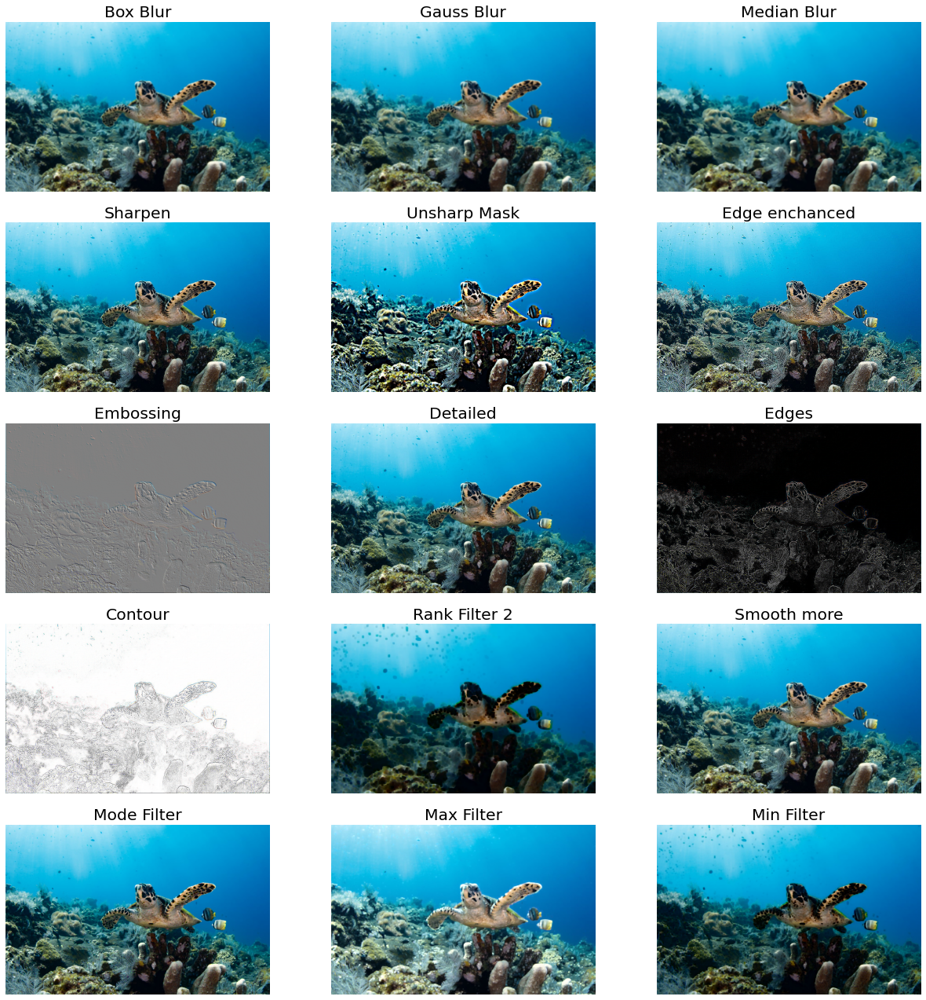

In [ ]:
from PIL import ImageFilter as imf

image = Image.open("image.png") 

fig, axs = plt.subplots(5,3,figsize=(18,18))

axplot(image.filter(imf.BLUR),axs[0,0],'Box Blur')
axplot(image.filter(imf.GaussianBlur(2)),axs[0,1],'Gauss Blur')
axplot(image.filter(imf.MedianFilter(9)),axs[0,2],'Median Blur')

axplot(image.filter(imf.SHARPEN),axs[1,0],'Sharpen')
axplot(image.filter(imf.UnsharpMask(9)),axs[1,1],'Unsharp Mask')
axplot(image.filter(imf.EDGE_ENHANCE_MORE), axs[1,2],'Edge enchanced')

axplot(image.filter(imf.EMBOSS),axs[2,0],'Embossing')
axplot(image.filter(imf.DETAIL),axs[2,1],'Detailed')
axplot(image.filter(imf.FIND_EDGES),axs[2,2],'Edges')

axplot(image.filter(imf.CONTOUR), axs[3,0],'Contour')
axplot(image.filter(imf.RankFilter(size=9, rank=2)),axs[3,1],'Rank Filter 2')
axplot(image.filter(imf.SMOOTH_MORE), axs[3,2],'Smooth more')

axplot(image.filter(imf.ModeFilter(5)),axs[4,0],'Mode Filter')
axplot(image.filter(imf.MaxFilter(5)),axs[4,1],'Max Filter') 
axplot(image.filter(imf.MinFilter(5)),axs[4,2],'Min Filter', True) 



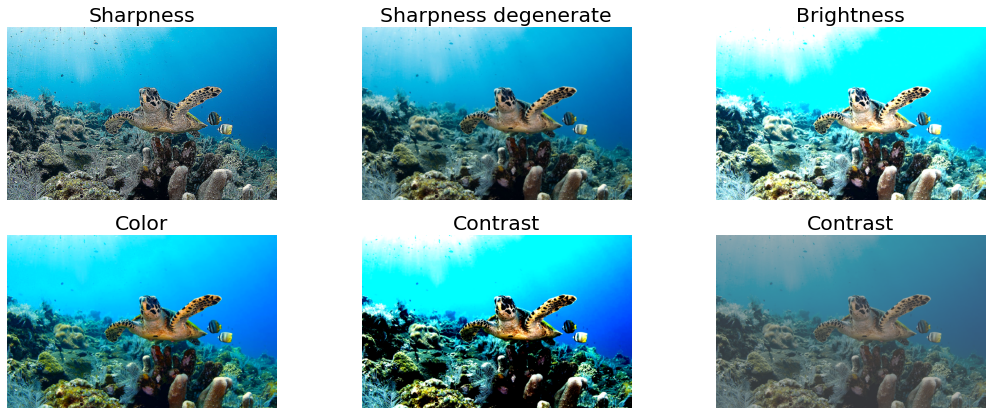

In [ ]:
from PIL import ImageEnhance as ief

image = Image.open("image.png") 

fig, axs = plt.subplots(2,3,figsize=(18,7))

axplot(ief.Sharpness(image).enhance(23.0),axs[0,0],'Sharpness')
axplot(ief.Sharpness(image).degenerate,axs[0,1],'Sharpness degenerate')
axplot(ief.Brightness(image).enhance(1.8),axs[0,2],'Brightness')
axplot(ief.Color(image).enhance(1.9),axs[1,0],'Color')
axplot(ief.Contrast(image).enhance(2.5),axs[1,1],'Contrast')
axplot(ief.Contrast(image).enhance(0.5),axs[1,2],'Contrast')

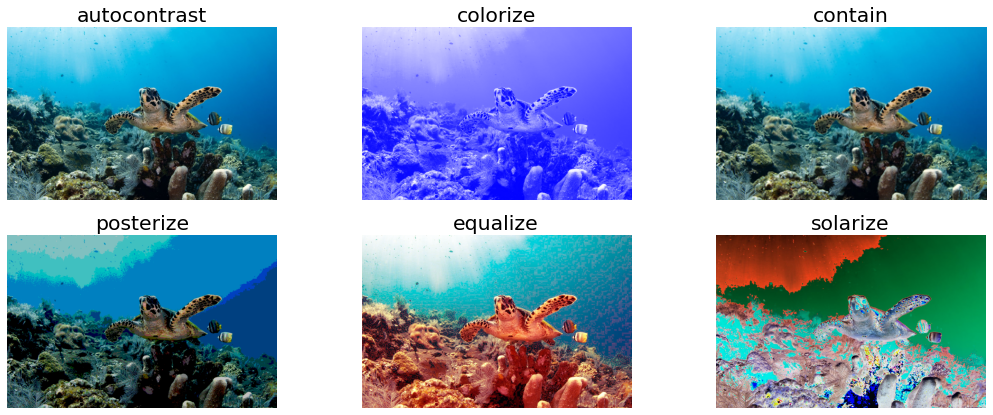

In [ ]:
import PIL.ImageOps
from PIL.ImageOps import *

image = Image.open("image.png") 

fig, axs = plt.subplots(2,3,figsize=(18,7))

axplot(PIL.ImageOps.autocontrast(image,) ,axs[0,0],'autocontrast')
axplot(PIL.ImageOps.colorize(image.convert('L'), black ="blue", white ="white",) ,axs[0,1],'colorize')
axplot(PIL.ImageOps.contain(image, (300, 800), method=3) ,axs[0,2],'contain')
axplot(PIL.ImageOps.posterize(image, bits=2) ,axs[1,0],'posterize')
axplot(PIL.ImageOps.equalize(image) ,axs[1,1],'equalize')
axplot(PIL.ImageOps.solarize(image,12) ,axs[1,2],'solarize')

